# Training a classification model that predicts the performance of a student.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
import pickle

In [2]:
dataset = pd.read_csv('Dataset.csv')
dataset.head()

,UID,Name,Sex,Age,10th,12th,Section,Sem1,Sem2,Sem3,...,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,20BCS6001,PARMAR AKSHAT BHANUPRASAD,Male,21,87,94,CSE-1,7.91,8.93,7.87,...,7.99,963,Android,Frontend,Python,Frontend,88.06,Machine Learning,Excellent,Yes
1,20BCS6002,KARA TERRY,Male,22,90,85,CSE-1,8.63,7.51,7.95,...,8.08,510,ML,DL,Backend,UI/UX,97.51,Analyst,Bad,No
2,20BCS6003,DHRUV SHARMA,Female,19,82,82,CSE-1,8.09,7.79,8.69,...,8.00,694,DL,Python,C,Android,87.20,Analyst,Average,No
3,20BCS6004,MEHNOOR KAUR,Male,22,92,79,CSE-1,8.49,7.54,7.74,...,8.05,661,C,Python,UI/UX,C,89.58,Software Development,Average,No
4,20BCS6005,SHRISTY KAPISMAY,Female,20,86,93,CSE-1,7.21,7.78,7.29,...,7.97,813,UI/UX,Android,UI/UX,UI/UX,82.72,Machine Learning,Good,Yes


In [3]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 24 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   UID              1000 non-null   object 
 1   Name             1000 non-null   object 
 2   Sex              1000 non-null   object 
 3   Age              1000 non-null   int64  
 4   10th             1000 non-null   int64  
 5   12th             1000 non-null   int64  
 6   Section          1000 non-null   object 
 7   Sem1             1000 non-null   float64
 8   Sem2             1000 non-null   float64
 9   Sem3             1000 non-null   float64
 10  Sem4             1000 non-null   float64
 11  Sem5             1000 non-null   float64
 12  Sem6             1000 non-null   float64
 13  Sem7             1000 non-null   float64
 14  Current CGPA     1000 non-null   float64
 15  AMCAT            1000 non-null   int64  
 16  Skill1           1000 non-null   object 
 17  Skill2         

In [4]:
dataset.describe()

,Age,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Avg. Attendance
count,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,20.498000,85.105000,87.46900,7.988990,7.977110,8.013090,7.982660,7.997890,8.020280,7.975080,7.993510,750.395000,85.301790
std,1.108704,8.751832,7.34745,0.588919,0.575438,0.570033,0.582557,0.560121,0.574379,0.572268,0.208346,141.369382,8.580377
min,19.000000,70.000000,75.00000,7.000000,7.000000,7.010000,7.000000,7.000000,7.000000,7.000000,7.300000,501.000000,70.020000
25%,20.000000,77.000000,81.00000,7.470000,7.467500,7.520000,7.480000,7.540000,7.530000,7.477500,7.850000,633.000000,78.077500
50%,20.000000,86.000000,87.00000,7.985000,7.975000,8.040000,7.980000,8.010000,8.040000,7.960000,7.990000,751.000000,85.400000
75%,21.000000,93.000000,94.00000,8.490000,8.450000,8.530000,8.490000,8.450000,8.530000,8.460000,8.130000,872.000000,92.662500
max,22.000000,99.000000,99.00000,8.990000,8.990000,9.000000,9.000000,9.000000,9.000000,9.000000,8.620000,998.000000,99.970000


## Data Preprocessing

In [5]:
dataset.isnull().sum()

UID                0
Name               0
Sex                0
Age                0
10th               0
12th               0
Section            0
Sem1               0
Sem2               0
Sem3               0
Sem4               0
Sem5               0
Sem6               0
Sem7               0
Current CGPA       0
AMCAT              0
Skill1             0
Skill2             0
Skill3             0
Skill4             0
Avg. Attendance    0
Course Assigned    0
Performance        0
Placed Status      0
dtype: int64

### Visualizations of Dataset

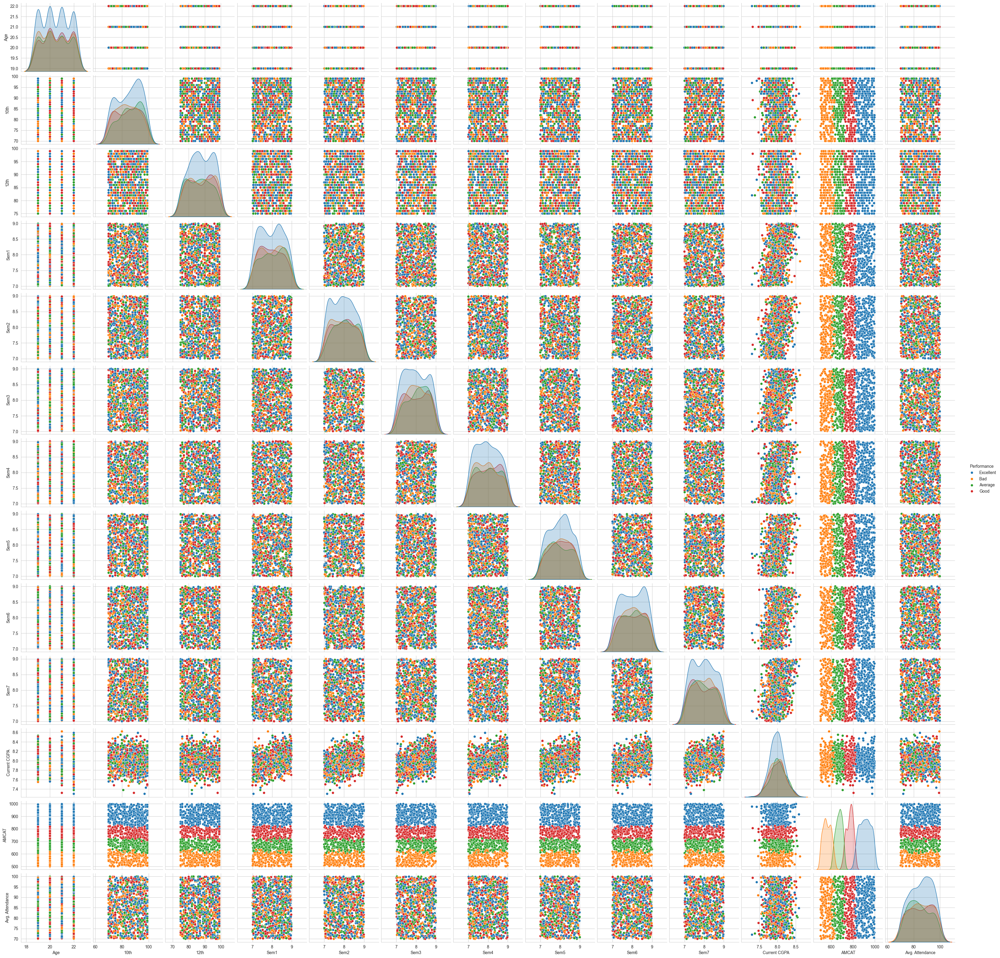

In [6]:
sns.pairplot(dataset, hue='Performance')
plt.show()

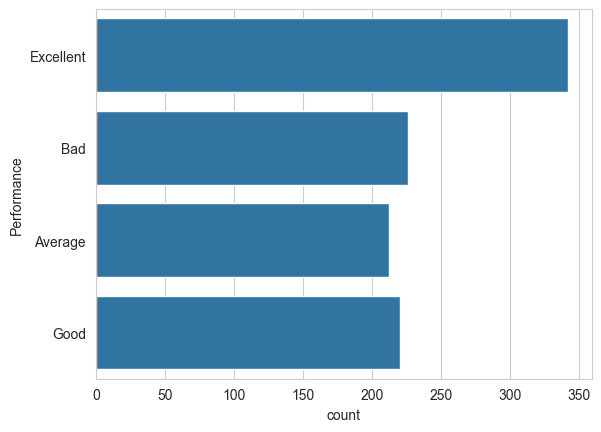

In [7]:
sns.countplot(dataset['Performance'])
plt.show()

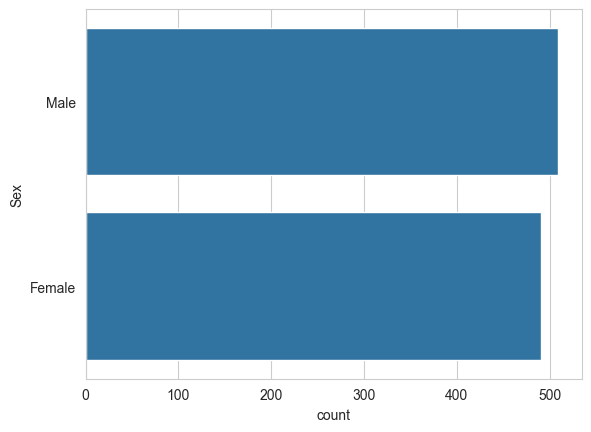

In [8]:
sns.countplot(dataset.Sex)
plt.show()

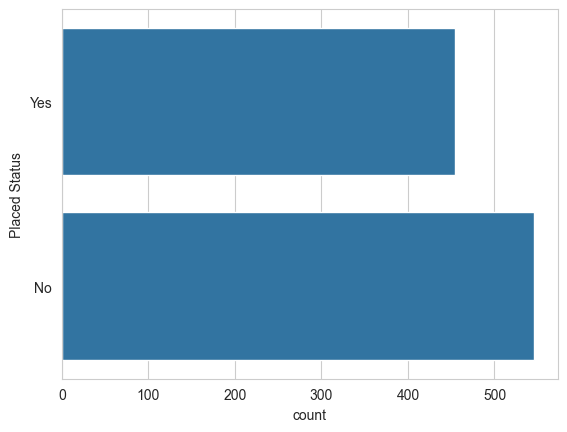

In [9]:
sns.countplot(dataset['Placed Status'])
plt.show()

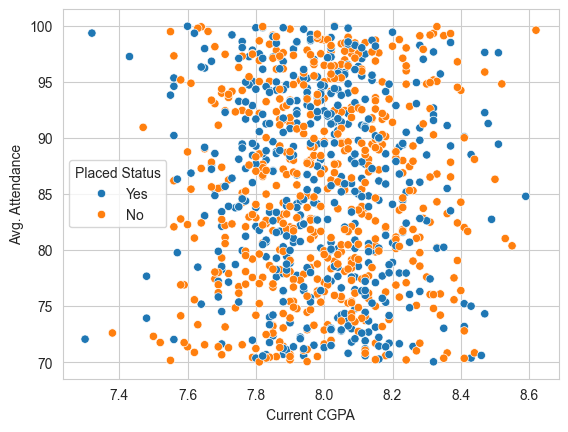

In [10]:
sns.scatterplot(x='Current CGPA', y='Avg. Attendance', data=dataset, hue='Placed Status')
plt.show()

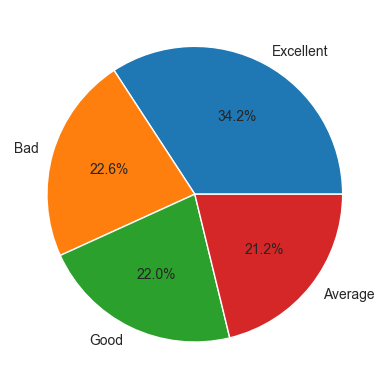

In [11]:
plt.pie(dataset['Performance'].value_counts(), labels=dataset['Performance'].value_counts().index, autopct='%1.1f%%')
plt.show()

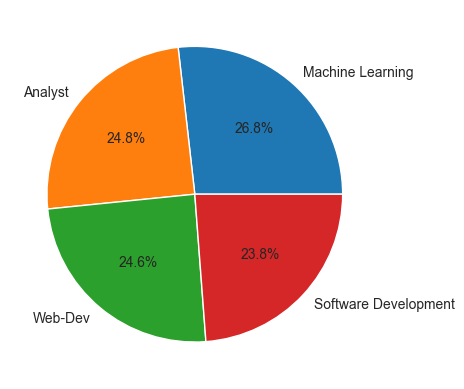

In [12]:
plt.pie(dataset['Course Assigned'].value_counts(), labels=dataset['Course Assigned'].value_counts().index,
        autopct='%1.1f%%')
plt.show()

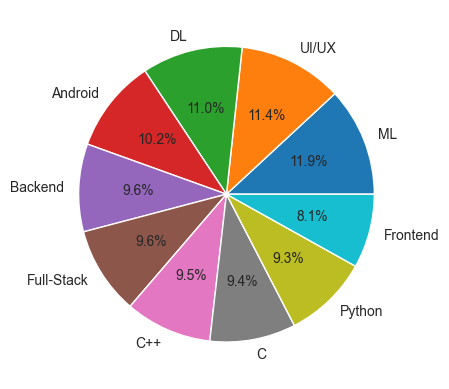

In [13]:
plt.pie(dataset['Skill1'].value_counts(), labels=dataset['Skill1'].value_counts().index, autopct='%1.1f%%')
plt.show()

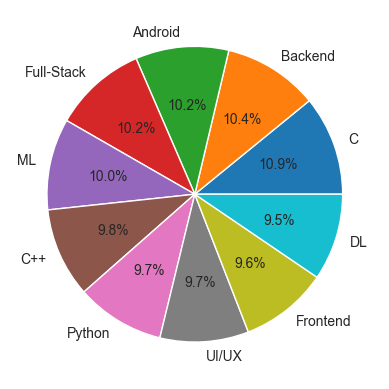

In [14]:
plt.pie(dataset['Skill2'].value_counts(), labels=dataset['Skill2'].value_counts().index, autopct='%1.1f%%')
plt.show()

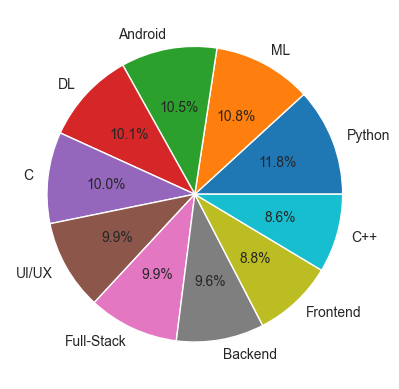

In [15]:
plt.pie(dataset['Skill3'].value_counts(), labels=dataset['Skill3'].value_counts().index, autopct='%1.1f%%')
plt.show()

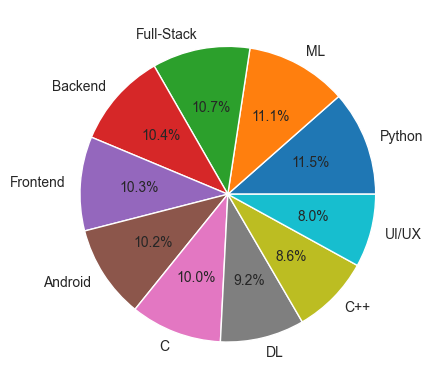

In [16]:
plt.pie(dataset['Skill4'].value_counts(), labels=dataset['Skill4'].value_counts().index, autopct='%1.1f%%')
plt.show()

## Feature Engineering

Useless columns
- UID
- Name
- Sex
- Age
- Section

Useful columns
- 10th
- 12th
- Sem1
- Sem2
- Sem3
- Sem4
- Sem5
- Sem6
- Sem7
- AMCAT
- Skill1
- Skill2
- Skill3
- Skill4
- Avg. Attendance

In [17]:
training_data = dataset.drop(['UID', 'Name', 'Section', 'Sex', 'Age'], axis=1)
training_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,87,94,7.91,8.93,7.87,7.60,7.01,7.91,8.71,7.99,963,Android,Frontend,Python,Frontend,88.06,Machine Learning,Excellent,Yes
1,90,85,8.63,7.51,7.95,8.19,7.23,8.66,8.36,8.08,510,ML,DL,Backend,UI/UX,97.51,Analyst,Bad,No
2,82,82,8.09,7.79,8.69,7.30,7.04,8.55,8.55,8.00,694,DL,Python,C,Android,87.20,Analyst,Average,No
3,92,79,8.49,7.54,7.74,7.35,8.91,7.37,8.93,8.05,661,C,Python,UI/UX,C,89.58,Software Development,Average,No
4,86,93,7.21,7.78,7.29,7.65,8.67,8.30,8.86,7.97,813,UI/UX,Android,UI/UX,UI/UX,82.72,Machine Learning,Good,Yes


### Encoding

In [18]:
training_data['Course Assigned'] = training_data['Course Assigned'].map(
    {'Machine Learning': 1, 'Analyst': 2, 'Software Development': 3, 'Web-Dev': 4})
training_data['Performance'] = training_data['Performance'].map({'Excellent': 1, 'Good': 2, 'Average': 3, 'Bad': 4})
training_data['Placed Status'] = training_data['Placed Status'].map({'Yes': 1, 'No': 0})
training_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,87,94,7.91,8.93,7.87,7.60,7.01,7.91,8.71,7.99,963,Android,Frontend,Python,Frontend,88.06,1,1,1
1,90,85,8.63,7.51,7.95,8.19,7.23,8.66,8.36,8.08,510,ML,DL,Backend,UI/UX,97.51,2,4,0
2,82,82,8.09,7.79,8.69,7.30,7.04,8.55,8.55,8.00,694,DL,Python,C,Android,87.20,2,3,0
3,92,79,8.49,7.54,7.74,7.35,8.91,7.37,8.93,8.05,661,C,Python,UI/UX,C,89.58,3,3,0
4,86,93,7.21,7.78,7.29,7.65,8.67,8.30,8.86,7.97,813,UI/UX,Android,UI/UX,UI/UX,82.72,1,2,1


In [19]:
skills = training_data.Skill1.unique()
skills

array(['Android', 'ML', 'DL', 'C', 'UI/UX', 'Backend', 'Frontend',
       'Full-Stack', 'Python', 'C++'], dtype=object)

In [20]:
# Create a mapping where the key is the value and the value is its index in the list 
mapping = {value: index for index, value in enumerate(skills)}

# Use pandas map function to replace values in column
training_data['Skill1'] = training_data['Skill1'].map(mapping)
training_data['Skill2'] = training_data['Skill2'].map(mapping)
training_data['Skill3'] = training_data['Skill3'].map(mapping)
training_data['Skill4'] = training_data['Skill4'].map(mapping)

# Print the modified DataFrame
training_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,87,94,7.91,8.93,7.87,7.60,7.01,7.91,8.71,7.99,963,0,6,8,6,88.06,1,1,1
1,90,85,8.63,7.51,7.95,8.19,7.23,8.66,8.36,8.08,510,1,2,5,4,97.51,2,4,0
2,82,82,8.09,7.79,8.69,7.30,7.04,8.55,8.55,8.00,694,2,8,3,0,87.20,2,3,0
3,92,79,8.49,7.54,7.74,7.35,8.91,7.37,8.93,8.05,661,3,8,4,3,89.58,3,3,0
4,86,93,7.21,7.78,7.29,7.65,8.67,8.30,8.86,7.97,813,4,0,4,4,82.72,1,2,1


### Splitting the dataset into the Training set and Test set

In [21]:
X = training_data.drop(['Course Assigned', 'Performance', 'Placed Status'], axis=1)
y1 = training_data['Course Assigned']
y2 = training_data['Performance']
y3 = training_data['Placed Status']

In [22]:
X_train1, X_test1, y1_train, y1_test = train_test_split(X, y1, test_size=0.2, random_state=0)
X_train2, X_test2, y2_train, y2_test = train_test_split(X, y2, test_size=0.2, random_state=0)
X_train3, X_test3, y3_train, y3_test = train_test_split(X, y3, test_size=0.2, random_state=0)

### Model Training

In [24]:
minmax = MinMaxScaler()
X_train1 = minmax.fit_transform(X_train1)
X_test1 = minmax.transform(X_test1)
X_train2 = minmax.fit_transform(X_train2)
X_test2 = minmax.transform(X_test2)
X_train3 = minmax.fit_transform(X_train3)
X_test3 = minmax.transform(X_test3)

In [25]:
classifiers = {
    "Logistic Regression": LogisticRegression(max_iter=5000),
    "Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine": SVC(),
    "Random Forest": RandomForestClassifier(),
    "Naive Bayes": GaussianNB(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Neural Network": MLPClassifier(max_iter=10000)
}

In [26]:
print("*** Course Assigned Training ***")
for name, clf in classifiers.items():
    clf.fit(X_train1, y1_train)
    print(name + " training completed.")
    print("Accuracy: {:.2f} %".format(cross_val_score(clf, X, y1, cv=10).mean() * 100))

*** Course Assigned Training ***
Logistic Regression training completed.


E:\BE\B E Courses\8th Semester\Capstone Project\venv\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
E:\BE\B E Courses\8th Semester\Capstone Project\venv\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

Accuracy: 26.80 %
Decision Tree training completed.
Accuracy: 25.60 %
Support Vector Machine training completed.
Accuracy: 27.70 %
Random Forest training completed.
Accuracy: 26.90 %
Naive Bayes training completed.
Accuracy: 26.60 %
K-Nearest Neighbors training completed.
Accuracy: 28.30 %
Neural Network training completed.
Accuracy: 25.40 %


In [27]:
print("*** Performance Training ***")
for name, clf in classifiers.items():
    clf.fit(X_train2, y2_train)
    print(name + " training completed.")
    print("Accuracy: {:.2f} %".format(cross_val_score(clf, X, y2, cv=10).mean() * 100))

*** Performance Training ***
Logistic Regression training completed.


E:\BE\B E Courses\8th Semester\Capstone Project\venv\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
E:\BE\B E Courses\8th Semester\Capstone Project\venv\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

Accuracy: 93.60 %
Decision Tree training completed.
Accuracy: 95.10 %
Support Vector Machine training completed.
Accuracy: 95.20 %
Random Forest training completed.
Accuracy: 95.60 %
Naive Bayes training completed.
Accuracy: 95.70 %
K-Nearest Neighbors training completed.
Accuracy: 97.50 %
Neural Network training completed.
Accuracy: 73.10 %


In [28]:
print("*** Placed Status Training ***")
for name, clf in classifiers.items():
    clf.fit(X_train3, y3_train)
    print(name + " training completed.")
    print("Accuracy: {:.2f} %".format(cross_val_score(clf, X, y3, cv=10).mean() * 100))

*** Placed Status Training ***
Logistic Regression training completed.
Accuracy: 99.60 %
Decision Tree training completed.
Accuracy: 98.50 %
Support Vector Machine training completed.
Accuracy: 97.90 %
Random Forest training completed.
Accuracy: 98.10 %
Naive Bayes training completed.
Accuracy: 97.90 %
K-Nearest Neighbors training completed.
Accuracy: 99.00 %
Neural Network training completed.
Accuracy: 92.70 %


### Model Evaluation

In [29]:
def model_evaluation(model, X_train, y_train, X_test, y_test, label):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=label, yticklabels=label)
    return model

*** Course Assigned Evaluation ***
0.245
              precision    recall  f1-score   support

           1       0.23      0.35      0.28        51
           2       0.26      0.31      0.29        45
           3       0.27      0.14      0.18        57
           4       0.23      0.19      0.21        47

    accuracy                           0.24       200
   macro avg       0.25      0.25      0.24       200
weighted avg       0.25      0.24      0.24       200


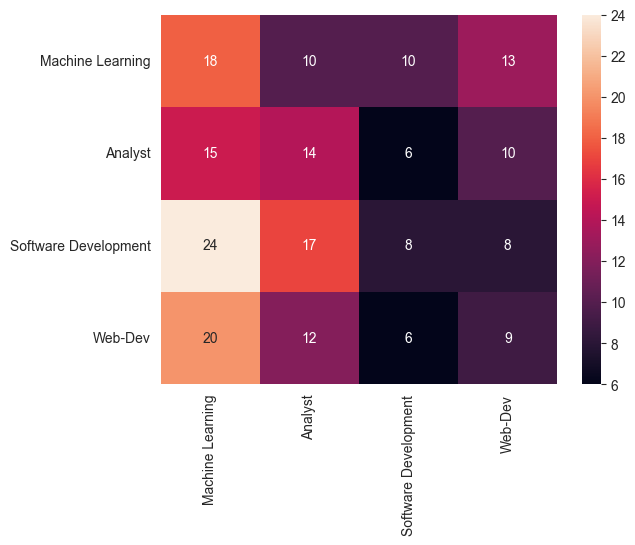

In [30]:
print("*** Course Assigned Evaluation ***")
model1 = model_evaluation(KNeighborsClassifier(), X_train1, y1_train, X_test1, y1_test,
                          label=dataset['Course Assigned'].unique())
pickle.dump(model1, open('course_assigned_model.pkl', 'wb'))

*** Performance Evaluation ***
0.525
              precision    recall  f1-score   support

           1       0.64      0.90      0.75        70
           2       0.22      0.19      0.20        43
           3       0.36      0.36      0.36        42
           4       0.79      0.42      0.55        45

    accuracy                           0.53       200
   macro avg       0.50      0.47      0.47       200
weighted avg       0.53      0.53      0.50       200


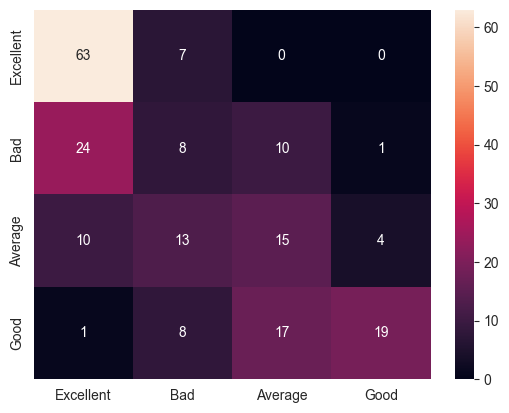

In [31]:
print("*** Performance Evaluation ***")
model2 = model_evaluation(KNeighborsClassifier(), X_train2, y2_train, X_test2, y2_test,
                          label=dataset['Performance'].unique())
pickle.dump(model2, open('performance_model.pkl', 'wb'))

*** Placed Status Evaluation ***
0.985
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       107
           1       0.98      0.99      0.98        93

    accuracy                           0.98       200
   macro avg       0.98      0.99      0.98       200
weighted avg       0.99      0.98      0.99       200


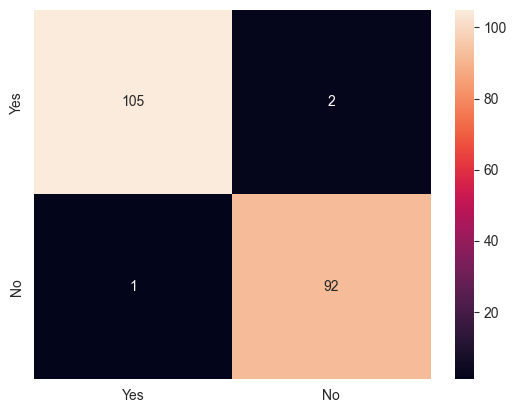

In [32]:
print("*** Placed Status Evaluation ***")
model3 = model_evaluation(LogisticRegression(), X_train3, y3_train, X_test3, y3_test,
                          label=dataset['Placed Status'].unique())
pickle.dump(model3, open('placed_status_model.pkl', 'wb'))

### Predictions

In [33]:
dataset.columns

Index(['UID', 'Name', 'Sex', 'Age', '10th', '12th', 'Section', 'Sem1', 'Sem2',
       'Sem3', 'Sem4', 'Sem5', 'Sem6', 'Sem7', 'Current CGPA', 'AMCAT',
       'Skill1', 'Skill2', 'Skill3', 'Skill4', 'Avg. Attendance',
       'Course Assigned', 'Performance', 'Placed Status'],
      dtype='object')

In [34]:
user_input1 = ['20BCS6739', 'Rituraj', 'Male', 20, 95, 89, 'CSE-10', 7.5, 7.9, 8.2, 8.5, 8.7, 8.9, 9.0, 8.7, 900,
               'Android', 'Python', 'Frontend', 'Backend', 95]
user_input2 = ['20BCS6739', 'Rituraj', 'Male', 20, 50, 50, 'CSE-10', 5, 5, 5, 5, 5, 5, 5, 5, 505, 'Android', 'Python',
               'Frontend', 'Backend', 90]

In [35]:
user_input = pd.DataFrame([user_input1], columns=dataset.columns[:21])
# user_input = pd.DataFrame([user_input2], columns=dataset.columns[:21])
input_data = user_input.drop(['UID', 'Name', 'Section', 'Sex', 'Age'], axis=1)
input_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance
0,95,89,7.5,7.9,8.2,8.5,8.7,8.9,9.0,8.7,900,Android,Python,Frontend,Backend,95


In [36]:
mapping = {value: index for index, value in enumerate(skills)}

input_data['Skill1'] = input_data['Skill1'].map(mapping)
input_data['Skill2'] = input_data['Skill2'].map(mapping)
input_data['Skill3'] = input_data['Skill3'].map(mapping)
input_data['Skill4'] = input_data['Skill4'].map(mapping)

input_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance
0,95,89,7.5,7.9,8.2,8.5,8.7,8.9,9.0,8.7,900,0,8,6,5,95


In [39]:
#MInMax Scaling
input_data = minmax.transform(input_data)

In [40]:
course = ['Machine Learning', 'Analyst', 'Software Development', 'Web-Dev']
performance = ['Excellent', 'Good', 'Average', 'Bad']
placement = ['Will', 'Will not']

In [41]:
username = user_input['Name'][0]
recommended_course = course[model1.predict(input_data)[0] - 1]
user_performance = performance[model2.predict(input_data)[0] - 1]
placement_status = placement[model3.predict(input_data)[0] - 1]
message = (f'Hi, {username}, I think you can study {recommended_course} course '
           f'and you are {user_performance} in performance. '
           f'Also, you {placement_status} get placed easily.')
print(message)

Hi, Rituraj, I think you can study Web-Dev course and you are Excellent in performance. Also, you Will get placed easily.


# OR

## Training the same model using Neural Network

In [55]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

if not tf.executing_eagerly():
    tf.compat.v1.enable_eager_execution()
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

In [56]:
dataset = pd.read_csv('Dataset.csv')
dataset.head()

,UID,Name,Sex,Age,10th,12th,Section,Sem1,Sem2,Sem3,...,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,20BCS6001,PARMAR AKSHAT BHANUPRASAD,Male,21,87,94,CSE-1,7.91,8.93,7.87,...,7.99,963,Android,Frontend,Python,Frontend,88.06,Machine Learning,Excellent,Yes
1,20BCS6002,KARA TERRY,Male,22,90,85,CSE-1,8.63,7.51,7.95,...,8.08,510,ML,DL,Backend,UI/UX,97.51,Analyst,Bad,No
2,20BCS6003,DHRUV SHARMA,Female,19,82,82,CSE-1,8.09,7.79,8.69,...,8.00,694,DL,Python,C,Android,87.20,Analyst,Average,No
3,20BCS6004,MEHNOOR KAUR,Male,22,92,79,CSE-1,8.49,7.54,7.74,...,8.05,661,C,Python,UI/UX,C,89.58,Software Development,Average,No
4,20BCS6005,SHRISTY KAPISMAY,Female,20,86,93,CSE-1,7.21,7.78,7.29,...,7.97,813,UI/UX,Android,UI/UX,UI/UX,82.72,Machine Learning,Good,Yes


In [57]:
training_data = dataset.drop(['UID', 'Name', 'Sex', 'Age', 'Section'], axis=1)
training_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,87,94,7.91,8.93,7.87,7.60,7.01,7.91,8.71,7.99,963,Android,Frontend,Python,Frontend,88.06,Machine Learning,Excellent,Yes
1,90,85,8.63,7.51,7.95,8.19,7.23,8.66,8.36,8.08,510,ML,DL,Backend,UI/UX,97.51,Analyst,Bad,No
2,82,82,8.09,7.79,8.69,7.30,7.04,8.55,8.55,8.00,694,DL,Python,C,Android,87.20,Analyst,Average,No
3,92,79,8.49,7.54,7.74,7.35,8.91,7.37,8.93,8.05,661,C,Python,UI/UX,C,89.58,Software Development,Average,No
4,86,93,7.21,7.78,7.29,7.65,8.67,8.30,8.86,7.97,813,UI/UX,Android,UI/UX,UI/UX,82.72,Machine Learning,Good,Yes


In [58]:
training_data['Course Assigned'] = training_data['Course Assigned'].map(
    {'Machine Learning': 1, 'Analyst': 2, 'Software Development': 3, 'Web-Dev': 4})
training_data['Performance'] = training_data['Performance'].map({'Excellent': 1, 'Good': 2, 'Average': 3, 'Bad': 4})
training_data['Placed Status'] = training_data['Placed Status'].map({'Yes': 1, 'No': 0})
training_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,87,94,7.91,8.93,7.87,7.60,7.01,7.91,8.71,7.99,963,Android,Frontend,Python,Frontend,88.06,1,1,1
1,90,85,8.63,7.51,7.95,8.19,7.23,8.66,8.36,8.08,510,ML,DL,Backend,UI/UX,97.51,2,4,0
2,82,82,8.09,7.79,8.69,7.30,7.04,8.55,8.55,8.00,694,DL,Python,C,Android,87.20,2,3,0
3,92,79,8.49,7.54,7.74,7.35,8.91,7.37,8.93,8.05,661,C,Python,UI/UX,C,89.58,3,3,0
4,86,93,7.21,7.78,7.29,7.65,8.67,8.30,8.86,7.97,813,UI/UX,Android,UI/UX,UI/UX,82.72,1,2,1


In [59]:
skills = training_data.Skill1.unique()
skills

array(['Android', 'ML', 'DL', 'C', 'UI/UX', 'Backend', 'Frontend',
       'Full-Stack', 'Python', 'C++'], dtype=object)

In [60]:
mapping = {value: index for index, value in enumerate(skills)}
training_data['Skill1'] = training_data['Skill1'].map(mapping)
training_data['Skill2'] = training_data['Skill2'].map(mapping)
training_data['Skill3'] = training_data['Skill3'].map(mapping)
training_data['Skill4'] = training_data['Skill4'].map(mapping)
training_data.head()

,10th,12th,Sem1,Sem2,Sem3,Sem4,Sem5,Sem6,Sem7,Current CGPA,AMCAT,Skill1,Skill2,Skill3,Skill4,Avg. Attendance,Course Assigned,Performance,Placed Status
0,87,94,7.91,8.93,7.87,7.60,7.01,7.91,8.71,7.99,963,0,6,8,6,88.06,1,1,1
1,90,85,8.63,7.51,7.95,8.19,7.23,8.66,8.36,8.08,510,1,2,5,4,97.51,2,4,0
2,82,82,8.09,7.79,8.69,7.30,7.04,8.55,8.55,8.00,694,2,8,3,0,87.20,2,3,0
3,92,79,8.49,7.54,7.74,7.35,8.91,7.37,8.93,8.05,661,3,8,4,3,89.58,3,3,0
4,86,93,7.21,7.78,7.29,7.65,8.67,8.30,8.86,7.97,813,4,0,4,4,82.72,1,2,1


In [61]:
X = training_data.drop(['Course Assigned', 'Performance', 'Placed Status'], axis=1)
y1 = training_data['Course Assigned']
y2 = training_data['Performance']
y3 = training_data['Placed Status']

In [62]:
X_train1, X_test1, y1_train, y1_test = train_test_split(X, y1, test_size=0.2, random_state=0)
X_train2, X_test2, y2_train, y2_test = train_test_split(X, y2, test_size=0.2, random_state=0)
X_train3, X_test3, y3_train, y3_test = train_test_split(X, y3, test_size=0.2, random_state=0)

In [63]:
minmax = MinMaxScaler()
X_train1 = minmax.fit_transform(X_train1)
X_test1 = minmax.transform(X_test1)
X_train2 = minmax.fit_transform(X_train2)
X_test2 = minmax.transform(X_test2)
X_train3 = minmax.fit_transform(X_train3)
X_test3 = minmax.transform(X_test3)

### Neural Network model for Course Assigned

In [64]:
model1 = Sequential()
model1.add(Dense(units=16, activation='relu'))
model1.add(Dropout(0.5))
model1.add(Dense(units=8, activation='relu'))
model1.add(Dropout(0.5))
model1.add(Dense(units=5, activation='softmax'))
model1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [65]:
history = model1.fit(X_train1, y1_train, epochs=500, batch_size=32, validation_data=(X_test1, y1_test))
model1.save('course_assigned_model.keras')

Epoch 1/500
25/25 [==============================] - 1s 10ms/step - loss: 1.6338 - accuracy: 0.2450 - val_loss: 1.5672 - val_accuracy: 0.2600
Epoch 2/500
25/25 [==============================] - 0s 4ms/step - loss: 1.5919 - accuracy: 0.2663 - val_loss: 1.5557 - val_accuracy: 0.2750
Epoch 3/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5856 - accuracy: 0.2550 - val_loss: 1.5446 - val_accuracy: 0.2900
Epoch 4/500
25/25 [==============================] - 0s 4ms/step - loss: 1.5746 - accuracy: 0.2600 - val_loss: 1.5368 - val_accuracy: 0.2900
Epoch 5/500
25/25 [==============================] - 0s 4ms/step - loss: 1.5587 - accuracy: 0.2775 - val_loss: 1.5292 - val_accuracy: 0.2900
Epoch 6/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5524 - accuracy: 0.2650 - val_loss: 1.5182 - val_accuracy: 0.2850
Epoch 7/500
25/25 [==============================] - 0s 4ms/step - loss: 1.5333 - accuracy: 0.2375 - val_loss: 1.5087 - val_accuracy: 0.3000
Epoch 8/500


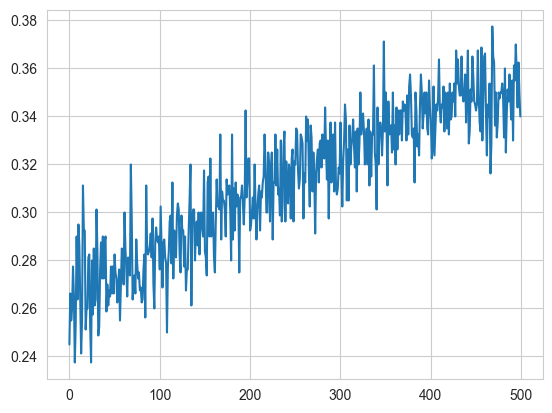

In [66]:
# Graph
plt.plot(history.history['accuracy'], label='accuracy')

In [67]:
model2 = Sequential()
model2.add(Dense(units=16, activation='relu'))
model2.add(Dropout(0.5))
model2.add(Dense(units=8, activation='relu'))
model2.add(Dropout(0.5))
model2.add(Dense(units=5, activation='softmax'))
model2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [68]:
history = model2.fit(X_train2, y2_train, epochs=500, batch_size=32, validation_data=(X_test2, y2_test))
model2.save('performance_model.keras')

Epoch 1/500
25/25 [==============================] - 1s 9ms/step - loss: 1.6089 - accuracy: 0.2488 - val_loss: 1.5926 - val_accuracy: 0.2850
Epoch 2/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5977 - accuracy: 0.2612 - val_loss: 1.5784 - val_accuracy: 0.2700
Epoch 3/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5778 - accuracy: 0.2925 - val_loss: 1.5668 - val_accuracy: 0.2700
Epoch 4/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5742 - accuracy: 0.2900 - val_loss: 1.5522 - val_accuracy: 0.2950
Epoch 5/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5530 - accuracy: 0.2750 - val_loss: 1.5337 - val_accuracy: 0.3200
Epoch 6/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5369 - accuracy: 0.3113 - val_loss: 1.5082 - val_accuracy: 0.3150
Epoch 7/500
25/25 [==============================] - 0s 3ms/step - loss: 1.5127 - accuracy: 0.3100 - val_loss: 1.4806 - val_accuracy: 0.3950
Epoch 8/500
2

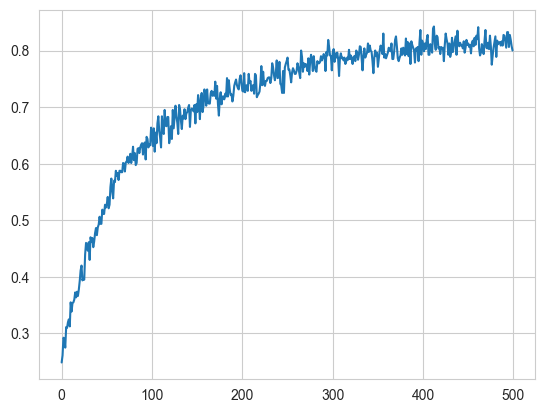

In [69]:
# Graph
plt.plot(history.history['accuracy'], label='accuracy')

In [71]:
model3 = Sequential()
model3.add(Dense(units=16, activation='relu'))
model3.add(Dropout(0.5))
model3.add(Dense(units=8, activation='relu'))
model3.add(Dropout(0.5))
model3.add(Dense(units=5, activation='softmax'))
model3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [72]:
history = model3.fit(X_train3, y3_train, epochs=200, batch_size=32, validation_data=(X_test3, y3_test))
model3.save('placed_status_model.keras')

Epoch 1/200
25/25 [==============================] - 1s 9ms/step - loss: 1.5041 - accuracy: 0.3512 - val_loss: 1.3528 - val_accuracy: 0.5250
Epoch 2/200
25/25 [==============================] - 0s 3ms/step - loss: 1.4445 - accuracy: 0.4238 - val_loss: 1.2543 - val_accuracy: 0.5500
Epoch 3/200
25/25 [==============================] - 0s 3ms/step - loss: 1.2791 - accuracy: 0.4875 - val_loss: 1.1335 - val_accuracy: 0.5750
Epoch 4/200
25/25 [==============================] - 0s 4ms/step - loss: 1.2123 - accuracy: 0.5163 - val_loss: 1.0212 - val_accuracy: 0.6050
Epoch 5/200
25/25 [==============================] - 0s 3ms/step - loss: 1.1063 - accuracy: 0.5225 - val_loss: 0.9237 - val_accuracy: 0.6300
Epoch 6/200
25/25 [==============================] - 0s 4ms/step - loss: 1.0448 - accuracy: 0.5425 - val_loss: 0.8569 - val_accuracy: 0.6050
Epoch 7/200
25/25 [==============================] - 0s 4ms/step - loss: 1.0210 - accuracy: 0.5362 - val_loss: 0.8090 - val_accuracy: 0.6550
Epoch 8/200
2

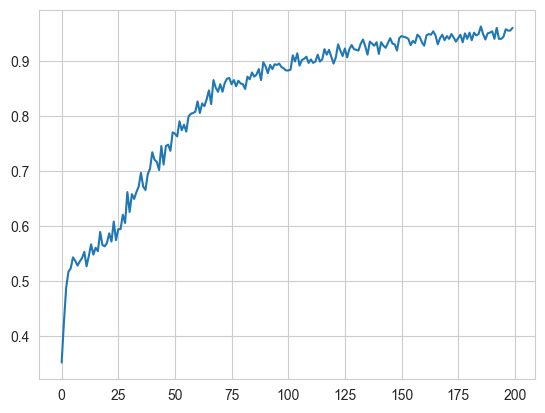

In [73]:
# Graph
plt.plot(history.history['accuracy'], label='accuracy')

### Predictions

In [74]:
# Load the models
model1 = tf.keras.models.load_model('course_assigned_model.keras')
model2 = tf.keras.models.load_model('performance_model.keras')
model3 = tf.keras.models.load_model('placed_status_model.keras')
model1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [75]:
user_input3 = ['20BCS6739', 'Rituraj', 'Male', 20, 95, 89, 'CSE-10', 7.5, 7.9, 8.2, 8.5, 8.7, 8.9, 9.0, 8.7, 900,
               'Android', 'Python', 'Frontend', 'Backend', 95]
user_input4 = ['20BCS6739', 'Rituraj', 'Male', 20, 50, 50, 'CSE-10', 5, 5, 5, 5, 5, 5, 5, 5, 505, 'Android', 'Python',
               'Frontend', 'Backend', 90]

In [76]:
user_input = pd.DataFrame([user_input3], columns=dataset.columns[:21])
# user_input = pd.DataFrame([user_input4], columns=dataset.columns[:21])
input_data = user_input.drop(['UID', 'Name', 'Sex', 'Age', 'Section'], axis=1)

In [77]:
mapping = {value: index for index, value in enumerate(skills)}
input_data['Skill1'] = input_data['Skill1'].map(mapping)
input_data['Skill2'] = input_data['Skill2'].map(mapping)
input_data['Skill3'] = input_data['Skill3'].map(mapping)
input_data['Skill4'] = input_data['Skill4'].map(mapping)

In [78]:
course = ['Machine Learning', 'Analyst', 'Software Development', 'Web-Dev']
performance = ['Excellent', 'Good', 'Average', 'Bad']
placement = ['Will', 'Will not']

In [79]:
username = user_input['Name'][0]
recommended_course = course[np.argmax(model1.predict(minmax.transform(input_data))) - 1]
user_performance = performance[np.argmax(model2.predict(minmax.transform(input_data))) - 1]
placement_status = placement[np.argmax(model3.predict(minmax.transform(input_data))) - 1]
message = (f'Hi, {username}, I think you can study {recommended_course} course '
           f'and you are {user_performance} in performance. '
           f'Also, you {placement_status} get placed easily.')
print(message)

1/1 [==============================] - 0s 67ms/step
Hi, Rituraj, I think you can study Machine Learning course and you are Excellent in performance. Also, you Will get placed easily.
